# NBA stats project

## 1) Import libraries

In [1]:
import scrapy
from scrapy import Selector
import requests
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.preprocessing as skp
import matplotlib as mpl
import string 
mpl.rcParams['figure.dpi'] = 300

## 2) Data scraping

In [2]:
# Create a list with the 30 NBA team names
teams = ['MIL', 'BOS', 'ATL', 'NJN', 'CHI', 'CLE', 'DAL', 'DEN', 'DET', 'GSW', 'NYK', 'OKC', 
         'PHI', 'PHO', 'POR', 'SAC', 'SAS', 'UTA', 'WAS', 'HOU', 'IND', 'LAC', 'LAL', 'MEM', 
         'MIA', 'MIN', 'NOH', 'ORL', 'TOR', 'CHA', ]

# Iterate over the teams list in order to scrape their stats from basketball-reference.com and 
# append them in two tables: table left (tablel) and table right (tabler). The website html
# separates the tabe elements into class="left" and class='right'.

selectors = []
tablel = []
tabler = []

for i in teams:
    url='https://www.basketball-reference.com/teams/'+i+'/stats_per_game_totals.html'
    html = requests.get(url).content
    selectors.append(Selector(text = html))
    tablel.append(selectors[teams.index(i)].xpath('//tbody//tr//*[@class="left "]//text()').extract())
    tabler.append(selectors[teams.index(i)].xpath('//tbody//tr//td[@class="right "]/text()').extract())

In [3]:
# Create a stats categories list by extracting the html table header
cats = selectors[0].xpath('//thead//tr//th//text()').extract()

In [5]:
print(len(cats), cats)

34 ['Season', 'Lg', 'Tm', 'W', 'L', 'Finish', '\xa0', 'Age', 'Ht.', 'Wt.', '\xa0', 'G', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS']


## 3) Data processing

In [6]:
# Clean up the cats by removing the \xa0
for i in cats:
    if i == '\xa0':
        cats.remove(i)

In [21]:
# Cats are clean and tidy, ready to move to the table
print(len(cats), cats)

32 ['Season', 'Lg', 'Tm', 'W', 'L', 'Finish', 'Age', 'Ht.', 'Wt.', 'G', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS']


In [22]:
# Clean up the table

In [23]:
# First of all, let's make a function to cut long lists to evenly-sized chunks

# Yield successive n-sized chunks from l. 
def divide_chunks(l, n):
    for i in range(0, len(l), n):  
        yield l[i:i + n] 
        

In [24]:
# The tablel contains triplets of season-NBA-team. I will split them and use them in the future
# to construct 3 dataframe columns. Each team is a list of multiple seasons. I will focus on 
# seasons 1979 - 2019 because the 3 point line was introduced in 1979
print(len(tablel), tablel[0][:9])

30 ['2019-20', 'NBA', 'MIL', '2018-19', 'NBA', 'MIL', '2017-18', 'NBA', 'MIL']


In [25]:
# I need to select the 123 first elements of each list (team) in order to have the last 41 seasons 
# (1979-2019). The teams that were founded after 1979 will result in fewer than 41 
# seasons/chunks/dataframe rows
# Let's see if it works for team 10 (New York Knicks)
print(tablel[10][:123])

['2019-20', 'NBA', 'NYK', '2018-19', 'NBA', 'NYK', '2017-18', 'NBA', 'NYK', '2016-17', 'NBA', 'NYK', '2015-16', 'NBA', 'NYK', '2014-15', 'NBA', 'NYK', '2013-14', 'NBA', 'NYK', '2012-13', 'NBA', 'NYK', '2011-12', 'NBA', 'NYK', '2010-11', 'NBA', 'NYK', '2009-10', 'NBA', 'NYK', '2008-09', 'NBA', 'NYK', '2007-08', 'NBA', 'NYK', '2006-07', 'NBA', 'NYK', '2005-06', 'NBA', 'NYK', '2004-05', 'NBA', 'NYK', '2003-04', 'NBA', 'NYK', '2002-03', 'NBA', 'NYK', '2001-02', 'NBA', 'NYK', '2000-01', 'NBA', 'NYK', '1999-00', 'NBA', 'NYK', '1998-99', 'NBA', 'NYK', '1997-98', 'NBA', 'NYK', '1996-97', 'NBA', 'NYK', '1995-96', 'NBA', 'NYK', '1994-95', 'NBA', 'NYK', '1993-94', 'NBA', 'NYK', '1992-93', 'NBA', 'NYK', '1991-92', 'NBA', 'NYK', '1990-91', 'NBA', 'NYK', '1989-90', 'NBA', 'NYK', '1988-89', 'NBA', 'NYK', '1987-88', 'NBA', 'NYK', '1986-87', 'NBA', 'NYK', '1985-86', 'NBA', 'NYK', '1984-85', 'NBA', 'NYK', '1983-84', 'NBA', 'NYK', '1982-83', 'NBA', 'NYK', '1981-82', 'NBA', 'NYK', '1980-81', 'NBA', 'NYK',

In [26]:
# Let's split the teams into 41 chunks

tablel2 = []

for i in range(len(teams)):
    tablel2.extend(list(divide_chunks(tablel[i][:123], 3)))

In [31]:
# Awesome! The 41 first triplets, are for Milwaukke Bucks (41 seasons). The 42nd triplet is for
# the next team (Boston Celtics)
print(len(tablel2), tablel2[0:42])

1134 [['2019-20', 'NBA', 'MIL'], ['2018-19', 'NBA', 'MIL'], ['2017-18', 'NBA', 'MIL'], ['2016-17', 'NBA', 'MIL'], ['2015-16', 'NBA', 'MIL'], ['2014-15', 'NBA', 'MIL'], ['2013-14', 'NBA', 'MIL'], ['2012-13', 'NBA', 'MIL'], ['2011-12', 'NBA', 'MIL'], ['2010-11', 'NBA', 'MIL'], ['2009-10', 'NBA', 'MIL'], ['2008-09', 'NBA', 'MIL'], ['2007-08', 'NBA', 'MIL'], ['2006-07', 'NBA', 'MIL'], ['2005-06', 'NBA', 'MIL'], ['2004-05', 'NBA', 'MIL'], ['2003-04', 'NBA', 'MIL'], ['2002-03', 'NBA', 'MIL'], ['2001-02', 'NBA', 'MIL'], ['2000-01', 'NBA', 'MIL'], ['1999-00', 'NBA', 'MIL'], ['1998-99', 'NBA', 'MIL'], ['1997-98', 'NBA', 'MIL'], ['1996-97', 'NBA', 'MIL'], ['1995-96', 'NBA', 'MIL'], ['1994-95', 'NBA', 'MIL'], ['1993-94', 'NBA', 'MIL'], ['1992-93', 'NBA', 'MIL'], ['1991-92', 'NBA', 'MIL'], ['1990-91', 'NBA', 'MIL'], ['1989-90', 'NBA', 'MIL'], ['1988-89', 'NBA', 'MIL'], ['1987-88', 'NBA', 'MIL'], ['1986-87', 'NBA', 'MIL'], ['1985-86', 'NBA', 'MIL'], ['1984-85', 'NBA', 'MIL'], ['1983-84', 'NBA', 'MI

In [32]:
#Perfect! Our left part of the table is ready. We now have independent triplets for each team
# from 1979 until today

In [85]:
# Tabler has 29 statistical categories from ALL teams from ALL seasons. The length of tabler is
# 30 (number of teams) but the length of each of these 30 lists varies, older teams (founded before
# 1979) have longer lists, younger teams (founded after 1979) have shorter ones.
print(len(tabler), tabler[0][:29])

30 ['53', '12', '1', '29.2', '6-6', '226', '65', '240.8', '43.5', '91.2', '.477', '13.7', '38.6', '.356', '29.8', '52.6', '.567', '17.8', '24.0', '.742', '9.5', '42.2', '51.7', '25.9', '7.4', '6.0', '14.9', '19.2', '118.6']


In [86]:
# Let's split the tabler into 41 chunks/seasons of 29 stats for each of the 30 teams. Teams 
# before 1979 will have 41 seasons (chunks) after this step. Younger teams will have fewer
# I will split each of the 30 lists in tabler but only until element 1189, because 29 stats *
# 41 seasons = 1189 elements per team (maximum) from 1979 on. 

tabler2 = []

for i in range(len(teams)):
    tabler2.extend(list(divide_chunks(tabler[i][:1189], 29)))

In [90]:
# Cool! Let's check the first 3 seasons of the first team (MIL)
print(tabler2[:2])

[['53', '12', '1', '29.2', '6-6', '226', '65', '240.8', '43.5', '91.2', '.477', '13.7', '38.6', '.356', '29.8', '52.6', '.567', '17.8', '24.0', '.742', '9.5', '42.2', '51.7', '25.9', '7.4', '6.0', '14.9', '19.2', '118.6'], ['60', '22', '1', '26.9', '6-7', '227', '82', '241.2', '43.4', '91.1', '.476', '13.5', '38.2', '.353', '29.9', '52.9', '.565', '17.9', '23.2', '.773', '9.3', '40.4', '49.7', '26.0', '7.5', '5.9', '13.9', '19.6', '118.1']]


In [98]:
#Let's combine everything into a nice df!!!

# Make 2 dataframes from the 2 lists of lists and concatenate them
df = pd.concat([pd.DataFrame(tablel2), pd.DataFrame(tabler2)], axis=1)
# Set cats as df column header
df.columns = cats
# Create a new column by combining season and team initials
df["Team"] = df["Season"] + " " + df["Tm"]
# Set the new column as index
df.index = df["Team"]
# Drop the League (NBA) column
df = df.drop(["Lg"], axis=1)
# Drop the team (old) column
df = df.drop(["Team"], axis=1)
# Drop the FG, FT, 2P and 3P columns. I will only keep the attempts and percentages of each shot.
df = df.drop(["FG", "FT", "2P", "3P"], axis=1)


In [99]:
# Make a loop to add a 'decade' column: If the first 3 digits of th index value are '201_' then
# add decade = 10s etc.
decade_list=[]

for i in df['Season']:
    if i[:3] == '201':
        decade_list.append('10s') 
    elif i[:3]  == '200':
        decade_list.append('00s')
    elif i[:3] == '199':
        decade_list.append('90s')
    else:
        decade_list.append('80s')

df['Decade'] = decade_list

In [104]:
# Convert player height to cm
height_list=[]

for i in df['Ht.']:
    height_list.append(np.sum([int(i.split('-')[0])*30.48, int(i.split('-')[1])*2.54]))

df['Height'] = height_list

In [105]:
season_list = []
for i in df['Season']:
    season_list.append(i[:4])
    
df['Season']= season_list

In [106]:
# Drop height in feet and season position
df = df.drop(["Ht."], axis=1)
df = df.drop(['Finish'], axis=1)

In [107]:
# Reorder the columns so that decade is close to the beginning of the df
df = df[['Tm', 'Decade', 'Season', 'W', 'L', 'Age', 'Height', 'Wt.', 'G', 'MP', 'FGA',
       'FG%', '3PA', '3P%', '2PA', '2P%', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 
         'BLK', 'TOV', 'PF', 'PTS']]

In [108]:
#PERFECT!!!
df.head()

,Tm,Decade,Season,W,L,Age,Height,Wt.,G,MP,...,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Team,,,,,,,,,,,,,,,,,,,,,
2019-20 MIL,MIL,10s,2019,53,12,29.2,198.12,226,65,240.8,...,.742,9.5,42.2,51.7,25.9,7.4,6.0,14.9,19.2,118.6
2018-19 MIL,MIL,10s,2018,60,22,26.9,200.66,227,82,241.2,...,.773,9.3,40.4,49.7,26.0,7.5,5.9,13.9,19.6,118.1
2017-18 MIL,MIL,10s,2017,44,38,25.9,200.66,218,82,241.8,...,.783,8.4,31.5,39.8,23.2,8.8,5.4,13.8,21.4,106.5
2016-17 MIL,MIL,10s,2016,42,40,25.6,200.66,223,82,241.2,...,.768,8.8,31.6,40.4,24.2,8.1,5.3,14.0,20.2,103.6
2015-16 MIL,MIL,10s,2015,33,49,23.5,203.20,228,82,241.8,...,.747,10.5,31.2,41.7,23.1,8.2,5.8,15.2,20.7,99.0


In [110]:
# Convert df to numeric. Convert all columns except for the first 2: Tm and Decade which will 
# remane as strings
df_num = df.iloc[:, 2:].apply(pd.to_numeric)

In [111]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1134 entries, 2019-20 MIL to 1988-89 CHH
Data columns (total 25 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Season  1134 non-null   int64  
 1   W       1134 non-null   int64  
 2   L       1134 non-null   int64  
 3   Age     1134 non-null   float64
 4   Height  1134 non-null   float64
 5   Wt.     1134 non-null   int64  
 6   G       1134 non-null   int64  
 7   MP      1134 non-null   float64
 8   FGA     1134 non-null   float64
 9   FG%     1134 non-null   float64
 10  3PA     1134 non-null   float64
 11  3P%     1134 non-null   float64
 12  2PA     1134 non-null   float64
 13  2P%     1134 non-null   float64
 14  FTA     1134 non-null   float64
 15  FT%     1134 non-null   float64
 16  ORB     1134 non-null   float64
 17  DRB     1134 non-null   float64
 18  TRB     1134 non-null   float64
 19  AST     1134 non-null   float64
 20  STL     1134 non-null   float64
 21  BLK     1134 non-null   f

In [112]:
# I will create a second dataframe with stats that relate to the game style of each team,
# and use this for clustering:
# Field Coal Attempts, Field Goal %, 3 Point Attempts, 3 Point %, 2 point Attempts, 2 point %, 
# Free Throw Attempts, Free Throw %, Offensice Rebounds, Defensive Rebounds, Total Rebounds, 
# Assists, Steals, Blocks, Turnovers, Personal Fouls, points
df_num.columns[8:]

Index(['FGA', 'FG%', '3PA', '3P%', '2PA', '2P%', 'FTA', 'FT%', 'ORB', 'DRB',
       'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS'],
      dtype='object')

In [118]:
# Create a second dataframe with the "clustering" stats
df_cl = df_num.iloc[:, 8:]

In [119]:
df_cl.head()

,FGA,FG%,3PA,3P%,2PA,2P%,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Team,,,,,,,,,,,,,,,,,
2019-20 MIL,91.2,0.477,38.6,0.356,52.6,0.567,24.0,0.742,9.5,42.2,51.7,25.9,7.4,6.0,14.9,19.2,118.6
2018-19 MIL,91.1,0.476,38.2,0.353,52.9,0.565,23.2,0.773,9.3,40.4,49.7,26.0,7.5,5.9,13.9,19.6,118.1
2017-18 MIL,83.0,0.478,24.7,0.355,58.3,0.531,23.4,0.783,8.4,31.5,39.8,23.2,8.8,5.4,13.8,21.4,106.5
2016-17 MIL,81.9,0.474,23.7,0.370,58.2,0.516,22.4,0.768,8.8,31.6,40.4,24.2,8.1,5.3,14.0,20.2,103.6
2015-16 MIL,82.2,0.467,15.6,0.345,66.6,0.495,22.7,0.747,10.5,31.2,41.7,23.1,8.2,5.8,15.2,20.7,99.0


In [120]:
df_cl.shape

(1134, 17)

## 4) Plotting

### a) Histograms

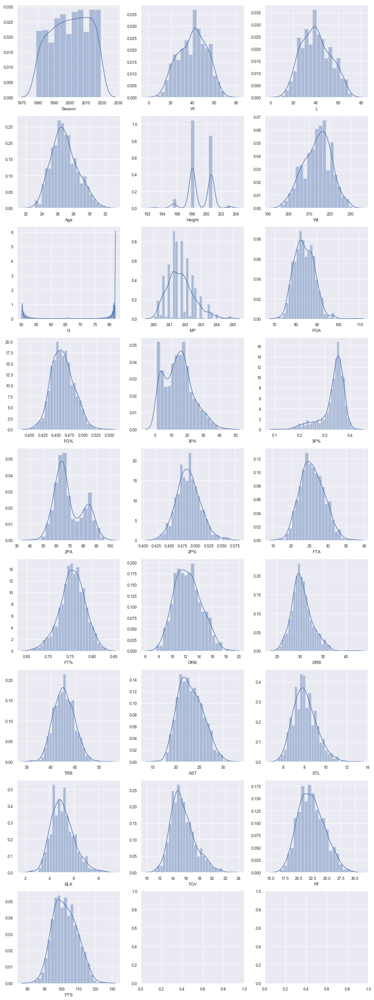

In [125]:
# Check the distribution of all variables in the numerical Dataframe (df_num)
sns.set(style='darkgrid')
sns.set_context('paper')

fig, axes = plt.subplots(ncols=3, nrows=9, figsize=(14, 40))
for i, ax in zip(df_num.columns, axes.flat):
    sns.distplot(df_num[i], hist=True, ax=ax)
plt.show()

### b) Boxplots

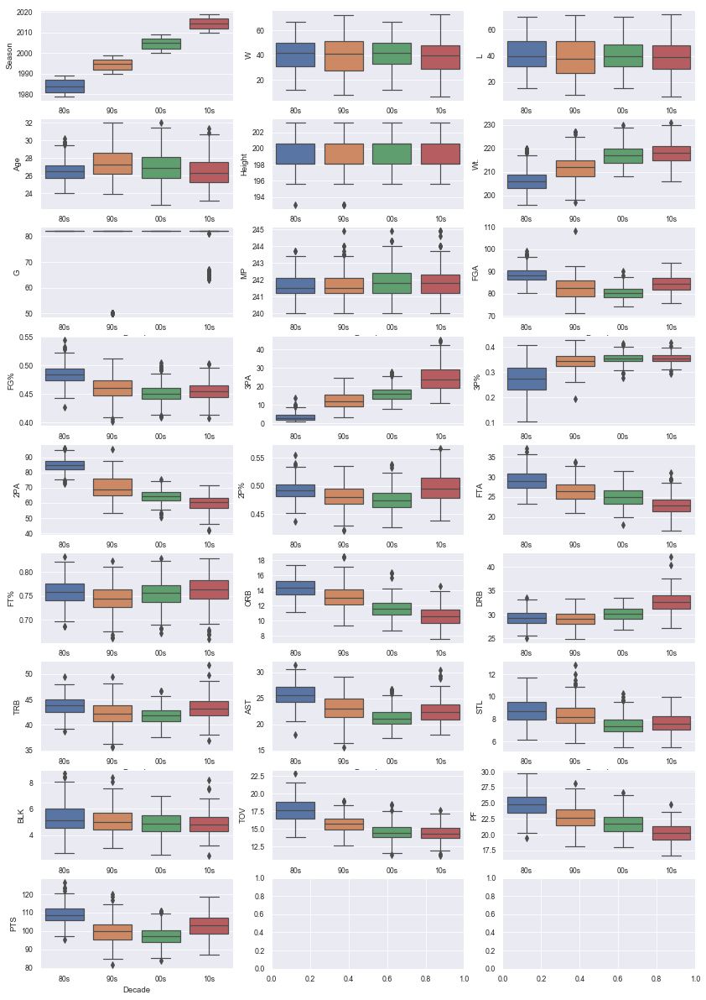

In [127]:
# Check the boxplot of the variables, grouped by decade
sns.set_context('paper')

fig, axes = plt.subplots(ncols=3, nrows=9, figsize=(14, 21))
for i, ax in zip(df_num.columns, axes.flat):
    sns.boxplot(df['Decade'], df_num[i], order=['80s', '90s', '00s', '10s'],
               hue_order=['80s', '90s', '00s', '10s'], ax=ax)
plt.show()

### c) Correlation heatmap

In [128]:
# Calculate pairwise correlation coefficients
dfcorr = df_num.corr()

In [129]:
# Keep only the strong ones, let's say > 0.6
dfcorr[abs(dfcorr)<0.6] = 0

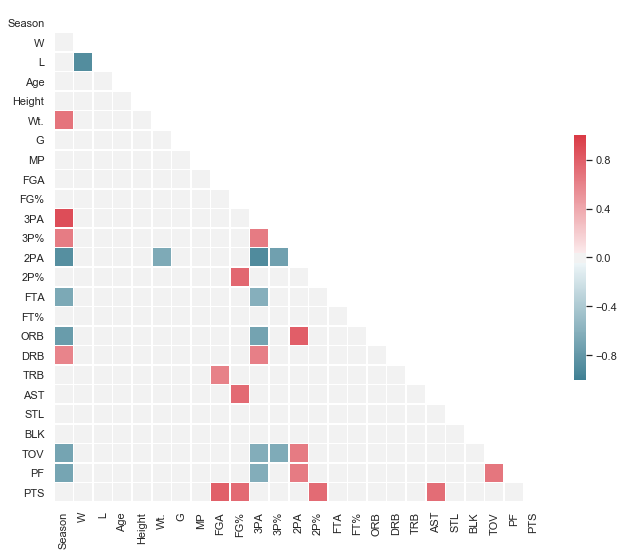

In [131]:
# Make a Seaborn heatmap using the correlation DataFrame we created
sns.set(style="white")
mask = np.triu(np.ones_like(dfcorr, dtype=np.bool))
fig, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(dfcorr, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

### d) Scatterplots

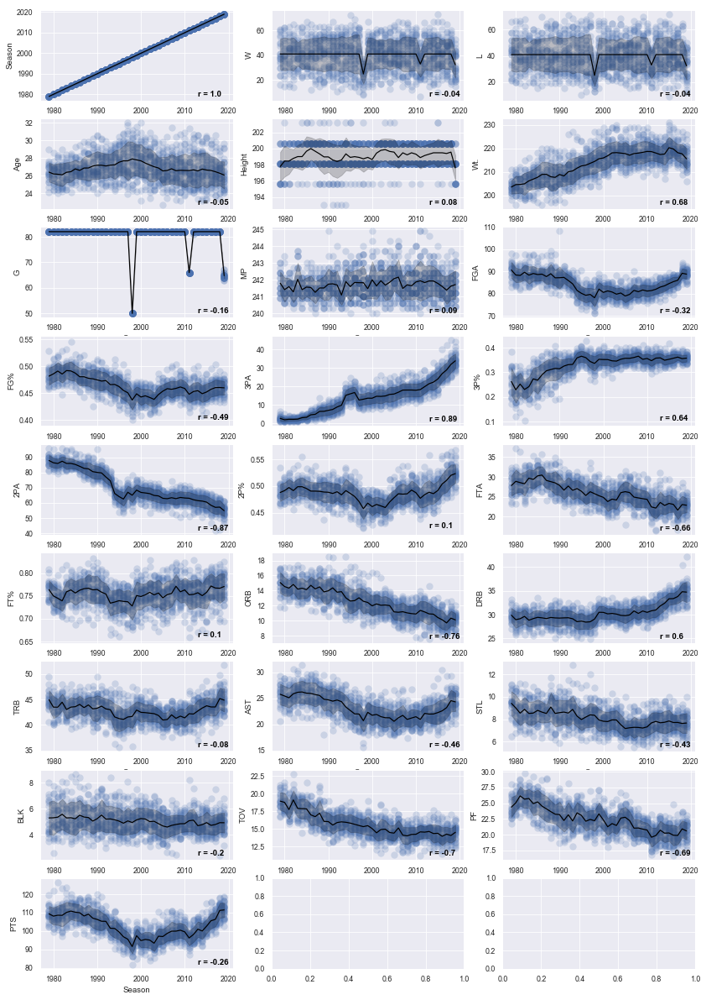

In [132]:
# Make scatterplots for all the variables 
sns.set(style='darkgrid')
sns.set_context('paper')

# plot 3 layers: a) scatterplot (blue dots) of each team against season, b) mean values against 
# season (black line) and c) standard deviation of each team against season (black shade).
# Lastly, add the correlation coefficients at the bottom right side of each subplot
fig, axes = plt.subplots(ncols=3, nrows=9, figsize=(14, 21))
for i, ax, y in zip(dfcorr.columns, axes.flat, range(29)):
    p1 = sns.scatterplot(df_num['Season'], df_num[i], alpha=0.2, s =70, ax=ax, linewidth=0)
    sns.lineplot(df_num['Season'], df_num[i], ax=ax, ci='sd', color='black')
    p1.text(2013, df_num[i].min(), "r = " + str(round(np.corrcoef(df_num['Season'], df_num[i])[0, 1], 2)), 
            horizontalalignment='left', size='medium', color='black', weight='semibold')
    
plt.show()

In [133]:
# Make two lists with the names of scoring (point)-related stats (prelated) and non scoring-related 
# (nrelated). I will use them in order to create two separate time series plots.
prelated = ['PTS', 'FGA', 'FG%', '2PA', '2P%', '3PA', '3P%', 'FTA', 'FT%']
nrelated = ['Wt.', 'ORB', 'DRB', 'TOV', 'PF']

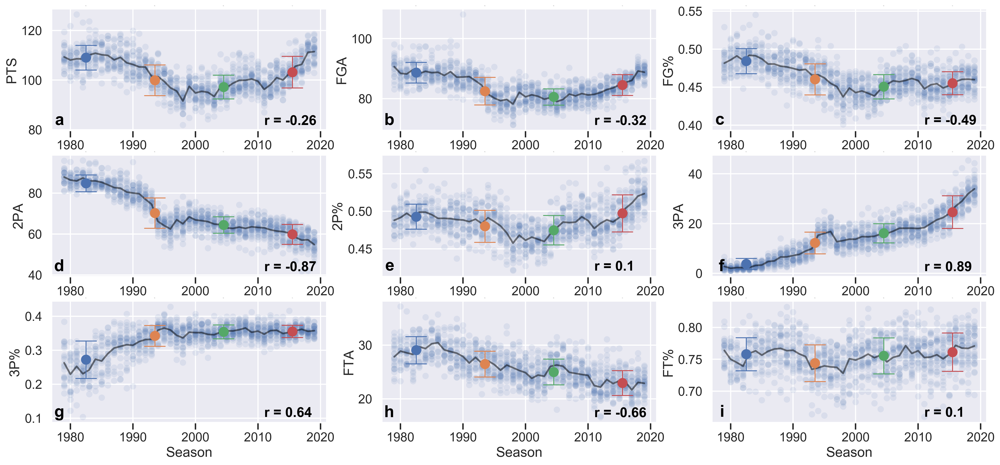

In [135]:
# Make time series for the point-related variables 
# Similar to the previous time series, only here the SD shade (for each individual season) is 
# replaced by a point plot of the mean and SD of each decade.
sns.set_context('talk')
mpl.rcParams['figure.dpi'] = 300
sns.set_style('darkgrid')

fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(22, 10))
for i, ax, y in zip(prelated, axes.flat, range(len(prelated))):
    ax2 = ax.twiny()
    p1 = sns.scatterplot(df_num['Season'], df_num[i], alpha=0.1, s =70, ax=ax, linewidth=0)
    sns.lineplot(df_num['Season'], df_num[i], ax=ax, ci=None, color='black', alpha = 0.5)
    sns.pointplot(df['Decade'], df_num[i], ci='sd', capsize=0.3, markers='o', scale=1, 
                  errwidth=1.2, hue=df['Decade'], order=['80s', '90s', '00s', '10s'], 
                  hue_order=['80s', '90s', '00s', '10s'], ax=ax2)
    p1.text(2011, df_num[i].min(), "r = " + str(round(np.corrcoef(df_num['Season'], df_num[i])[0, 1], 2)), 
            horizontalalignment='left', size='medium', color='black', weight='semibold')
    p1.text(1979, df_num[i].min(), string.ascii_lowercase[y], horizontalalignment='right', 
            size='large', color='black', weight='semibold')
    ax2.set_xlabel('')
    ax2.tick_params(axis='x', labelsize=0, length=0)
    ax2.get_legend().set_visible(False)

plt.show()

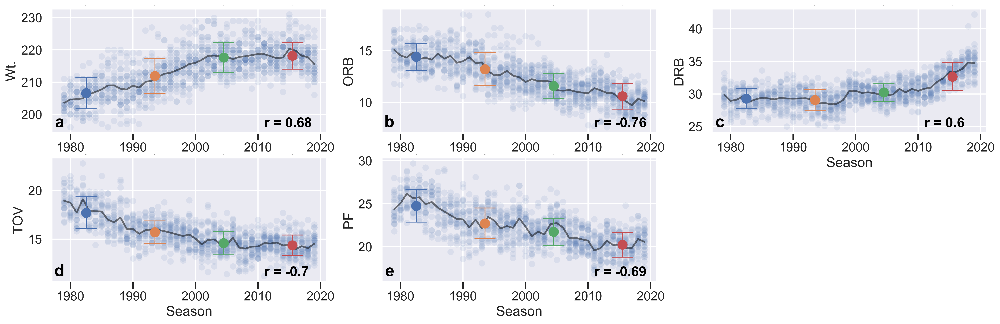

In [145]:
# Make time series for the non point-related variables 
sns.set_context('talk')
mpl.rcParams['figure.dpi'] = 300
sns.set_style('darkgrid')

fig = plt.figure(figsize=(22, 6.6))

for i, y in zip(nrelated, range(len(nrelated))):
    ax = fig.add_subplot(2, 3, y+1)
    ax2 = ax.twiny()
    p1 = sns.scatterplot(df_num['Season'], df_num[i], alpha=0.1, s =70, ax=ax, linewidth=0)
    sns.lineplot(df_num['Season'], df_num[i], ax=ax, ci=None, color='black', alpha=0.5)
    sns.pointplot(df['Decade'], df_num[i], ci='sd',  capsize=0.3, 
                  markers='o', scale=1, errwidth=1.2, hue=df['Decade'],
                  order=['80s', '90s', '00s', '10s'], hue_order=['80s', '90s', '00s', '10s'], 
                  ax=ax2)
    p1.text(2011, df_num[i].min(), "r = " + str(round(np.corrcoef(df_num['Season'], df_num[i])[0, 1], 2)), 
            horizontalalignment='left', size='medium', color='black', weight='semibold')
    p1.text(1979, df_num[i].min(), string.ascii_lowercase[y], horizontalalignment='right', 
            size='large', color='black', weight='semibold')
    ax2.set_xlabel('')
    ax2.tick_params(axis='x', labelsize=0, length=0)
    ax2.get_legend().set_visible(False)

plt.show()

### e) Clustermap

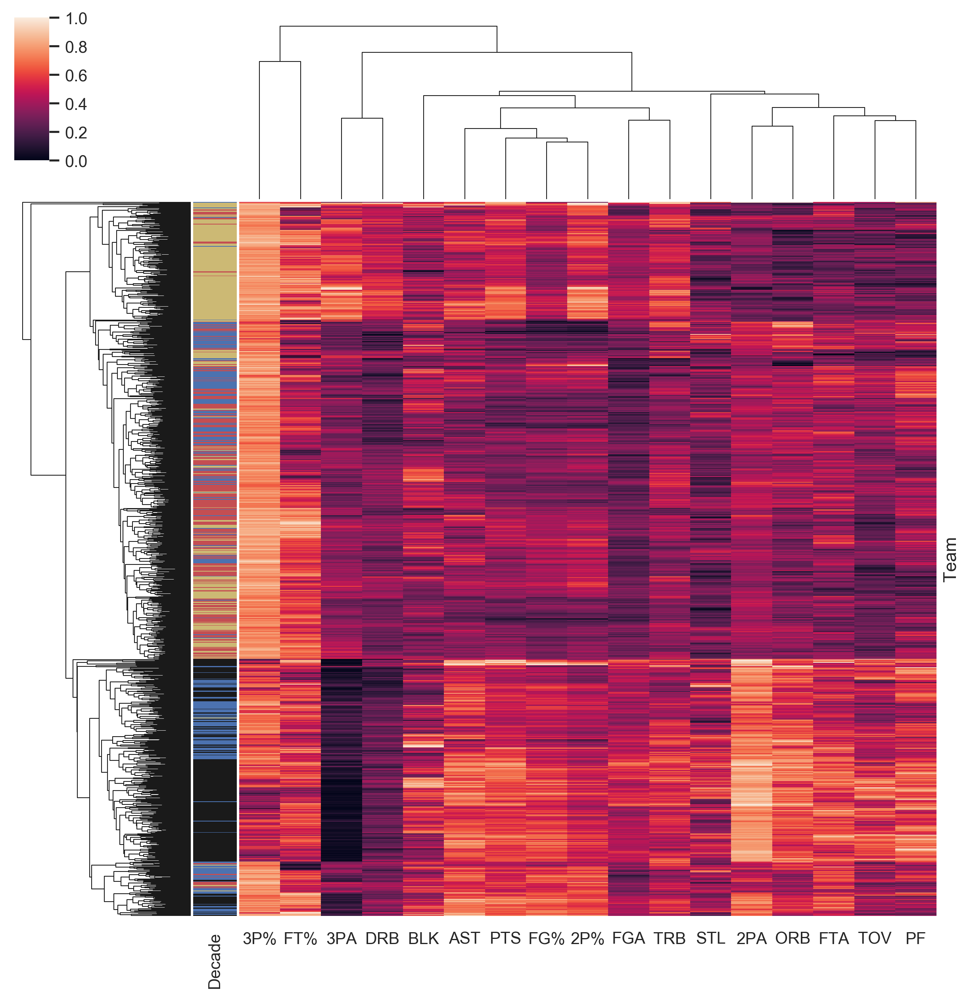

In [154]:
# Make a clustermap to check the hierarchical clustering of the teams and the statistical
# categories. The two main clusters of teams, seem to have different decade composition (black, 
#blue, red and yellow colors).  

lut1 = dict(zip(df["Decade"].unique(), "yrbk"))
row_colors1 = df["Decade"].map(lut1)
sns.set(font_scale = 0.9)

g = sns.clustermap(df_cl, standard_scale = 1, col_cluster = True, 
               row_colors=row_colors1, yticklabels=False, cbar_kws={"orientation": "vertical"})

# Stats separate into 4 clusters: a) no change throuhgout the decades (3P% and FT%), b) Increasing 
# with time (3PA and DRB), c) lower in the 90s and 00s (BLK, AST, PTS, FG%, 2P%, FGA and TRB)and
# d) decreasing with time (STL, 2PA, ORB, FTA, TOV, PF)

### f) Principal Component Analysis

In [155]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [160]:
# Normalize the df_cl
x = StandardScaler().fit_transform(df_cl.values)

In [161]:
# Check the shape of the normalized df
x.shape

(1134, 17)

In [162]:
# Check the scaled df's mean and STD
np.mean(x), np.std(x)

(-5.594998821889366e-16, 1.0)

In [176]:
# Create a new dataframe (ndf2) with the normalized values
ndf_cl = pd.DataFrame(x, columns=df_cl.columns, index=df_cl.index)
ndf_cl

,FGA,FG%,3PA,3P%,2PA,2P%,FTA,FT%,ORB,DRB,TRB,AST,STL,BLK,TOV,PF,PTS
Team,,,,,,,,,,,,,,,,,
2019-20 MIL,1.558076,0.709467,2.746017,0.488773,-1.573414,3.539833,-0.537157,-0.435871,-1.448426,5.313524,4.189181,1.072431,-0.599529,0.979539,-0.336989,-1.325963,2.307973
2018-19 MIL,1.536634,0.662355,2.700230,0.425174,-1.545189,3.452320,-0.782146,0.630050,-1.549349,4.504655,3.253724,1.110776,-0.507556,0.874776,-0.886364,-1.153478,2.237701
2017-18 MIL,-0.200205,0.756580,1.154914,0.467573,-1.037136,1.964601,-0.720899,0.973896,-2.003501,0.505246,-1.376788,0.037127,0.688096,0.350964,-0.941301,-0.377293,0.607389
2016-17 MIL,-0.436072,0.568131,1.040446,0.785570,-1.046545,1.308255,-1.027136,0.458127,-1.801656,0.550183,-1.096151,0.420573,0.044283,0.246201,-0.831426,-0.894749,0.199811
2015-16 MIL,-0.371745,0.238345,0.113257,0.255575,-0.256241,0.389370,-0.935265,-0.263949,-0.943813,0.370435,-0.488104,-0.001217,0.136257,0.770014,-0.172176,-0.679143,-0.446692
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1992-93 CHH,0.850475,1.180590,-0.928401,-0.147221,1.136198,0.608152,0.994028,0.561281,0.519565,0.100811,0.540899,1.264154,-0.231636,0.770014,0.377199,-0.204808,1.113348
1991-92 CHH,1.793943,0.709467,-1.157337,-0.338019,1.738334,-0.004437,0.197812,0.011128,0.923255,-0.663121,0.166716,1.839323,1.791775,-1.325236,-0.007364,-0.032322,1.029021
1990-91 CHH,0.400183,0.238345,-1.088656,-0.401618,1.070340,-0.398245,0.381554,0.836358,0.065413,-1.606801,-1.563879,0.573952,1.147963,-1.429999,0.102511,0.614499,0.087375


In [177]:
# Perform PCA on the normalized dataframe, for 2 princial components
pca_df_cl = PCA(n_components=17)
principalComponents_df_cl = pca_df_cl.fit_transform(x)

In [178]:
# Checking the PC shape
principalComponents_df_cl.shape

(1134, 17)

In [179]:
# Let's see how much of the variance is explained by each PC

pca_df_cl.explained_variance_ratio_
# The first two PCs explain 38.9% and 20.5%

array([3.88888841e-01, 2.04637738e-01, 9.17481032e-02, 6.60485709e-02,
       5.55194689e-02, 4.34988099e-02, 3.62715908e-02, 3.23918334e-02,
       2.41036721e-02, 1.99817544e-02, 1.42454115e-02, 1.21644126e-02,
       9.54272114e-03, 9.12323659e-04, 3.37589713e-05, 1.02675731e-05,
       7.22228249e-07])

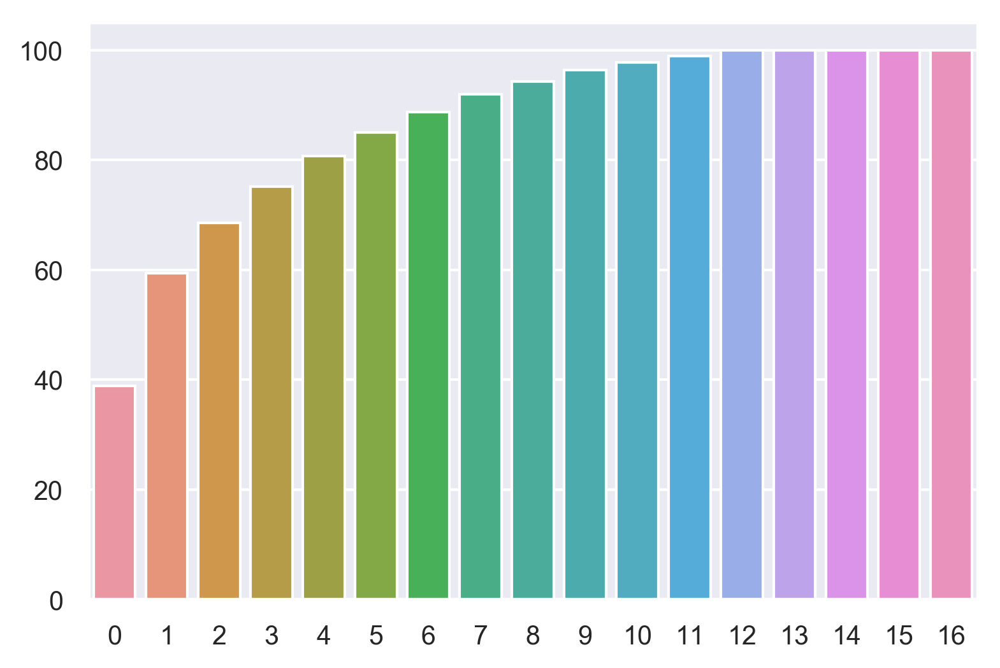

In [183]:
# The two first PCs explain about 60% of the variance in the data. If I wanted 80% I should take
# 5 PCs. I will continue with the first 2 PCs and always keep in mind that they only explain 60%)
sns.barplot(x = np.array(range(len(pca_df_cl.explained_variance_ratio_))), 
            y=np.cumsum(pca_df_cl.explained_variance_ratio_ * 100))

In [189]:
# Let's create a new dataframe with the principal components and back the columns I removed before
# normalizing the data.
principal_df_cl = pd.DataFrame(data = principalComponents_df_cl[:, :2]
             , columns = ['principal component 1', 'principal component 2'], index=df.index)

In [190]:
# Add back 10 stats from the original DataFrame (df) in order to use them for the PCA plot
principal_df_cl = pd.concat([principal_df_cl, df.iloc[:, :10]], axis=1)

In [192]:
principal_df_cl.head()

,principal component 1,principal component 2,Tm,Decade,Season,W,L,Age,Height,Wt.,G,MP
Team,,,,,,,,,,,,
2019-20 MIL,-0.978597,8.130203,MIL,10s,2019,53,12,29.2,198.12,226,65,240.8
2018-19 MIL,-1.231815,7.721805,MIL,10s,2018,60,22,26.9,200.66,227,82,241.2
2017-18 MIL,-1.695485,2.330341,MIL,10s,2017,44,38,25.9,200.66,218,82,241.8
2016-17 MIL,-2.157165,1.953470,MIL,10s,2016,42,40,25.6,200.66,223,82,241.2
2015-16 MIL,-1.098681,0.435504,MIL,10s,2015,33,49,23.5,203.20,228,82,241.8


In [213]:
# Create a dataframe with the loadings, in order to plot them with the PCs
loadings_df_cl = pd.DataFrame(data = pca_df_cl.components_
             , columns = df_cl.columns)

In [214]:
# Keep only the first two PCs
loadings_df_cl = loadings_df_cl.iloc[:2, :]

In [215]:
# Transpose the loadings
loadings_df_cl = loadings_df_cl.T

In [219]:
loadings_df_cl.head()

,0,1
FGA,0.250544,0.235298
FG%,0.254188,0.253496
3PA,-0.298252,0.255030
3P%,-0.289207,0.101234
2PA,0.355097,-0.106374


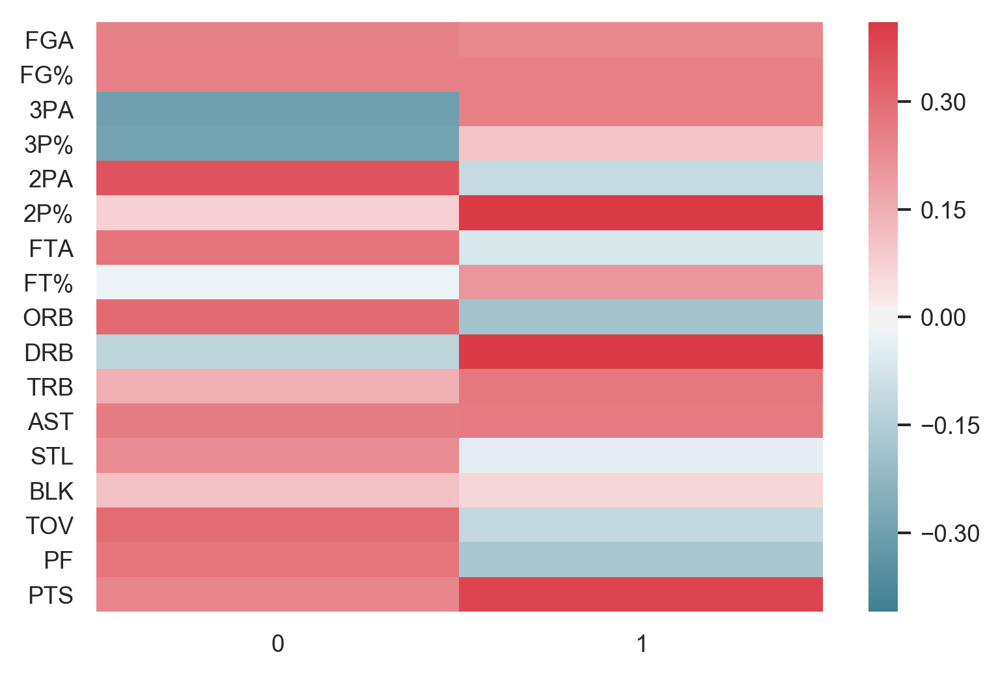

In [221]:
# Let's see the importance of the loadings for eac PC:
# 3PA, 3p% and 2PA seem important for PC1
# 2P%, DRB and PTS are important for PC2
sns.set_context('paper')
cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(loadings_df_cl, cmap=cmap, center=0, vmin=-0.41, vmax=0.41)

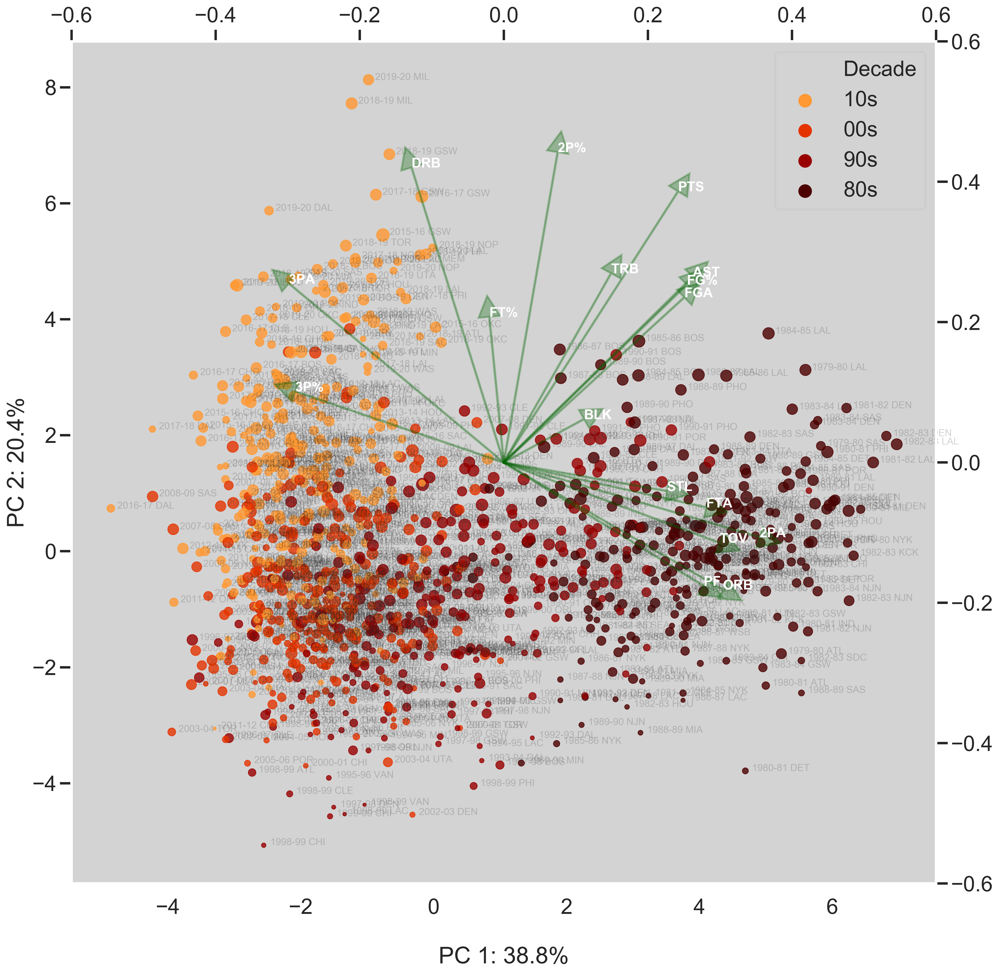

In [227]:
#Prepare the plot properties
sns.set_style('dark', {"axes.facecolor": "lightgrey"})
sns.set_context('poster')
mpl.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(16, 16))
ax2 = ax.twinx().twiny()

# Create a Seaborn scatterplot
g = sns.scatterplot(data = principal_df_cl, x='principal component 1', y='principal component 2', 
                    alpha = 0.8, hue = 'Decade', s = pd.to_numeric(principal_df_cl['W'])**1.2, 
                    palette="gist_heat_r", edgecolor=None, ax = ax)
   

# Add annotations: Team names (df.index)
for i in range(0, len(principal_df_cl.index)):
   ax.annotate(principal_df_cl.index[i], (principal_df_cl.loc[:, 'principal component 1'][i] + 0.1, 
                       principal_df_cl.loc[:, 'principal component 2'][i]), fontsize=10, 
                alpha = 0.2) 
    
# Plot the loadings as arrows   
ax2.set_xlim(-0.6, 0.6)
ax2.set_ylim(-0.6, 0.6)

for j in range(0, len(loadings_df_cl.index)):
    ax2.arrow(0, 0, loadings_df_cl.iloc[:, 0][j], loadings_df_cl.iloc[:, 1][j],  head_width=0.03, 
              head_length=0.03, color='darkgreen', alpha = 0.3)
    
# Annotate the loadings
for z in range(0, len(loadings_df_cl.index)):
   ax2.annotate(loadings_df_cl.index[z], (loadings_df_cl.iloc[:, 0][z], loadings_df_cl.iloc[:, 1][z]),
                fontsize=14, color='white', weight='semibold') 

# Create x and y labels that show the PCA - explained variance percentages
ax.set_xlabel("\nPC 1: " + str(pca_df_cl.explained_variance_ratio_[0]*100)[0:4] + "%")
ax.set_ylabel("PC 2: " + str(pca_df_cl.explained_variance_ratio_[1]*100)[0:4] + "%")

plt.show()

# Bokeh

In [228]:
from bokeh.plotting import figure
from bokeh.io import output_file, show, curdoc, output_notebook, push_notebook
from bokeh.models import HoverTool, CDSView, CustomJS, IndexFilter, BooleanFilter, ColorBar, LinearColorMapper, LogColorMapper, ContinuousTicker, ColorMapper, ColorBar, Ticker, Button, ColumnDataSource, Slider, Arrow, OpenHead, CheckboxGroup, NormalHead, VeeHead, LabelSet, Label, Select
from bokeh.layouts import column, row, widgetbox
from bokeh.transform import linear_cmap
from bokeh.themes import built_in_themes
from bokeh.embed import components

output_notebook()

Loading BokehJS ...

In [229]:
# The principal component DataFrame is not fully numeric
principal_df_cl.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1134 entries, 2019-20 MIL to 1988-89 CHH
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   principal component 1  1134 non-null   float64
 1   principal component 2  1134 non-null   float64
 2   Tm                     1134 non-null   object 
 3   Decade                 1134 non-null   object 
 4   Season                 1134 non-null   object 
 5   W                      1134 non-null   object 
 6   L                      1134 non-null   object 
 7   Age                    1134 non-null   object 
 8   Height                 1134 non-null   float64
 9   Wt.                    1134 non-null   object 
 10  G                      1134 non-null   object 
 11  MP                     1134 non-null   object 
dtypes: float64(3), object(9)
memory usage: 155.2+ KB


In [230]:
loadings_df_cl.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17 entries, FGA to PTS
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       17 non-null     float64
 1   1       17 non-null     float64
dtypes: float64(2)
memory usage: 1.0+ KB


In [234]:
# Let's convert it to numeric (not the first 4 columns which include team and decade, we need 
# those as categorical variables)
principal_df_cl= pd.concat([principal_df_cl.iloc[:, :4], 
                               principal_df_cl.iloc[:, 4:].apply(pd.to_numeric)], axis=1)

In [235]:
principal_df_cl.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1134 entries, 2019-20 MIL to 1988-89 CHH
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   principal component 1  1134 non-null   float64
 1   principal component 2  1134 non-null   float64
 2   Tm                     1134 non-null   object 
 3   Decade                 1134 non-null   object 
 4   Season                 1134 non-null   int64  
 5   W                      1134 non-null   int64  
 6   L                      1134 non-null   int64  
 7   Age                    1134 non-null   float64
 8   Height                 1134 non-null   float64
 9   Wt.                    1134 non-null   int64  
 10  G                      1134 non-null   int64  
 11  MP                     1134 non-null   float64
dtypes: float64(5), int64(5), object(2)
memory usage: 155.2+ KB


In [233]:
principal_df_cl.columns

Index(['principal component 1', 'principal component 2', 'Tm', 'Decade',
       'Season', 'W', 'L', 'Age', 'Height', 'Wt.', 'G', 'MP'],
      dtype='object')

In [239]:
# Reset the index, so that I can use the previous index as a column in this plot
principal_df_cl = principal_df_cl.reset_index()

In [241]:
# Create 3 ColoumnDataSources: one for the initial plot (Curr), one for the updating plot (Overall)
# and one for plotting the loadings (source2)
Overall = ColumnDataSource(principal_df_cl)
Curr = ColumnDataSource(principal_df_cl)
source2 = ColumnDataSource(data={'x': loadings_df_cl.iloc[:, 0]*17, 'y':loadings_df_cl.iloc[:, 1]*17, 
                           'loadings':loadings_df_cl.index})


In [242]:
# Create a Hover tool that shows season and team
hover = HoverTool(tooltips=[('Team', '@Tm'), ('Season', '@Season')])

In [249]:
# Create a stand-alone Bokeh app. Usually Bokeh apps need the Bokeh server to operate (i.e. update 
# the plots with the sliders and drop down menus) but I'll create callbacks with JavaScript. This
# way, i will have a stand-alone, fully interactive Bokeh app

# Save as HTML file
output_file("NBA_stats.html")

# Prepare the figure
plot = figure(plot_width=600, plot_height=600, x_range=(-6, 9), y_range=(-6, 9), 
              title='Principal component analysis of NBA teams', 
              tools=[hover, 'box_zoom','wheel_zoom', 'pan', 'reset'],
              x_axis_label='PC 1 (38.8%)', y_axis_label='PC 2 (20.4%)')
plot.xaxis.axis_label_text_font_size = "12pt"
plot.yaxis.axis_label_text_font_size = "12pt"

# Plot the PCA as scatterplot
cmap = LinearColorMapper(palette="Viridis256", low = 15, high = 65)
r = plot.circle(x= 'principal component 1', y='principal component 2', source=Curr, size=10, 
            alpha=0.5, fill_color={"field":"W", "transform":cmap})

# Plot loadings as arrows
for j in range(0, len(loadings_df_cl.index)):
    plot.add_layout(Arrow(end=NormalHead(size=8, fill_color="darkorange", line_width=0.5, 
                        line_color='orange', line_alpha = 0.3, fill_alpha = 0.3),
                          line_color='orange', line_alpha=0.3,  x_start=0, y_start=0, 
                          x_end=loadings_df_cl.iloc[:, 0][j]*17, y_end=loadings_df_cl.iloc[:, 1][j]*17))

# Annotate the loadings
for w in range(0, len(loadings_df_cl.index)):
    plot.add_layout(LabelSet(x='x', y='y', text='loadings', level='glyph', x_offset=1, 
                                      y_offset=1, source=source2, render_mode='canvas', 
                             text_color='white', text_font_size = '7pt'))


# Create a slider for the years (seasons). This callback is created using JavaScript and not
# Python for the reasons explained earlier.
callback1 = CustomJS(args=dict(source=Overall, sc=Curr), code="""       
        var f = slider.value;
        sc.data['principal component 1'] = [];
        sc.data['principal component 2'] = [];
        sc.data['W'] = [];
        sc.data['Season'] = [];
        sc.data['Tm'] = [];
        
        for (var i = 0; i <= source.get_length(); i++){
          if (source.data['Season'][i] <= f){
            sc.data['principal component 1'].push(source.data['principal component 1'][i])
            sc.data['principal component 2'].push(source.data['principal component 2'][i])
            sc.data['W'].push(source.data['W'][i])
            sc.data['Season'].push(source.data['Season'][i])
            sc.data['Tm'].push(source.data['Tm'][i])
          }
        }
        sc.change.emit();
    """)
slider = Slider(start=1979, end=2019, value=1979, step=1, title='Season', callback=callback1)
callback1.args["slider"] = slider

# Create a drop-down menu for the Teams. This callback is created using JavaScript and not
# Python for the reasons explained earlier.
callback2 = CustomJS(args=dict(source=Overall, sc=Curr), code="""       
        var j = menu.value;
        sc.data['principal component 1'] = [];
        sc.data['principal component 2'] = [];
        sc.data['W'] = [];
        sc.data['Season'] = [];
        sc.data['Tm'] = [];
        
        for (var w = 0; w <= source.get_length(); w++){
          if (source.data['Tm'][w] == j){
            sc.data['principal component 1'].push(source.data['principal component 1'][w])
            sc.data['principal component 2'].push(source.data['principal component 2'][w])
            sc.data['W'].push(source.data['W'][w])
            sc.data['Season'].push(source.data['Season'][w])
            sc.data['Tm'].push(source.data['Tm'][w])
          }
        }
        sc.change.emit();
    """)

menu = Select(options= principal_df_cl['Tm'].unique().tolist(), value='None', title='Teams',
             callback = callback2)
callback2.args["menu"] = menu

# Add a colorbar
bar = ColorBar(color_mapper=cmap, label_standoff=8, location=(0,0), title='Wins')
plot.add_layout(bar, "right")

# Change plot background
plot.background_fill_color = "grey"
plot.background_fill_alpha = 0.4

# Arrange plots and widgets in layouts
layout = column(menu, plot, slider)

In [250]:
# The plot is saved as HTML but it can also be shown in the Jupyter notebook:
show(layout)